This notebook will show the r-process path motion in the ($n, \gamma$)-($\gamma, n$) equilibrium phase. We will use our simple nuclear model to discuss the r-path in a Z-N plain. 
Let's begin by importing the necessary packages.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from scipy import special
import math
import wnutils as wx
from IPython.display import HTML

With our simple model, choose the appropriate constants for calculating neutron separation energy.

In [2]:
S0 = 20
S1 = 0.5
C1 = 0
C2 = 1
Cs = 1.5

Define a step function to show the shell effect.

In [3]:
def Theta(x):
    if x > 0:
        return (1)
    else:
        return (0)

Choose a range and plot $S_n$ vs. $N$.

Text(0, 0.5, '$S_n$ (MeV)')

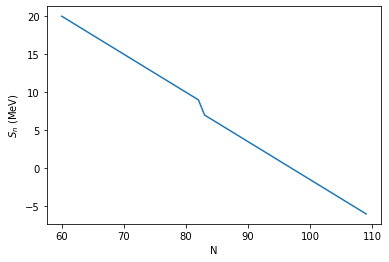

In [4]:
N = np.arange(60,110)
Sn = []
for i in range(len(N)):
    Sn.append(S0 + S1 * (N[0] - N[i]) - Cs * Theta(N[i] - 82))
plt.plot(N, Sn)
plt.xlabel('N')
plt.ylabel('$S_n$ (MeV)')

Define some physical constants for the chemical potential calculation.

In [5]:
Na = 6.02*10**23
k = 0.08617
mn = 939.565
hbar_c = 1.973*10**(-11)

Define a function to get the value of $\mu_n'$ and the corresponding $S_n$ in $(n, \gamma)-(\gamma, n)$ equilibrium

In [6]:
def get_mu(T9, Yn, rho):
    Sn = []
    Mu = []
    for t9 in range(len(T9)):
        mu = k*T9[t9]*math.log((rho[t9]*Na*Yn[t9]*(2*math.pi*(hbar_c**2)/(mn*k*T9[t9]))**(3/2))/2)
        Mu.append(mu)
        sn = -mu+S1/2
        Sn.append(sn)
    return (Mu, Sn)

Define the duration.

In [7]:
t = np.linspace(0., 3, 100)

Define the temperature as a function of time.  Use a constant velocity wind-like trajectory such that $T_9(t) = T_9(0) / (1 + t/\tau_T)^2$.

In [8]:
T9_0 = 3
tau_T = 1
T9 = T9_0/(1+t/tau_T)**2

Graph the temperature as a function of time.

Text(0, 0.5, '$T_9$')

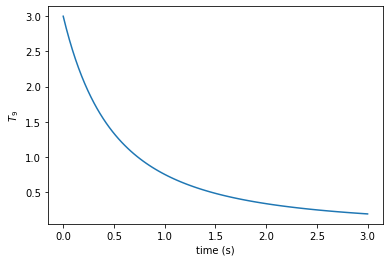

In [9]:
plt.plot(t, T9)
plt.xlabel('time (s)')
plt.ylabel('$T_9$')

Now set and the neutron abundance as a function of time:  $Y_n(t) = Y_{n,0} \times (1/2) {erfc}((t - t_1)/\tau_{n,2}) + Y_{n,1} \exp(-t/\tau_{n,2})$.

In [10]:
t_1 = 1.5
Yn_0 = 0.5
Yn_1 = 1.e-15
tau_n_1 = 0.05
tau_n_2 = 0.1
Yn = (1./2.) * Yn_0 * special.erfc((t - t_1)/tau_n_1) + Yn_1 * np.exp(-t / tau_n_2)

Plot $Y_n(t)$.

Text(0, 0.5, '$Y_n$')

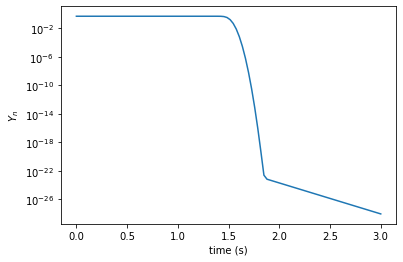

In [11]:
plt.plot(t, Yn)
plt.yscale('log')
plt.xlabel('time (s)')
plt.ylabel('$Y_n$')

Choose the density dependence on temperature ($\rho \propto T^b$) and compute $\mu_n'(t)$ and the path separation energy as a function of time.

In [12]:
b = 3/2
rho_0 = 1.e6
rho = rho_0 * (T9/T9_0)**b
Mu, Sn_t = np.array(get_mu(T9, Yn, rho))

Plot the path seperation energy as a function of time.

Text(0, 0.5, '$S_n$ (MeV)')

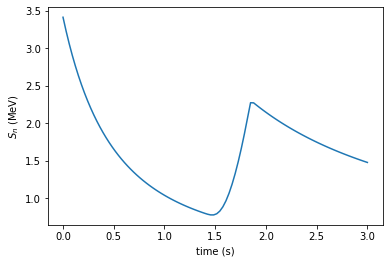

In [13]:
plt.plot(t, Sn_t)
plt.xlabel('time (s)')
plt.ylabel('$S_n$ (MeV)')

Draw a frame with the large frame showing the r-path, two inserted frames showing the $Y_n$ and $T_9$

In [14]:
fig = plt.figure(figsize=(12,10))

left, bottom, width, height = 0.1,0.1,0.8,0.8
ax3 = fig.add_axes([left,bottom,width,height])
ax3.set_xlabel("N")
ax3.set_ylabel("Z")
txt_title = ax3.set_title('',fontsize=10)
l2, = ax3.plot([],[], linestyle = 'solid', color = 'r', zorder=1)

left, bottom, width, height = 0.15,0.62,0.25,0.25
ax1 = fig.add_axes([left,bottom,width,height])
l4, = ax1.plot([],[], "ro", zorder=1)
ax1.set_xlabel("Time (s)")
ax1.set_ylabel(r"$Y_n$")

left, bottom, width, height = 0.62,0.15,0.25,0.25
ax2 = fig.add_axes([left,bottom,width,height])
l6, = ax2.plot([],[], "ro", zorder=1)
ax2.set_xlabel('Time (s)')
ax2.set_ylabel(r'$T_9$')
plt.close()

Define the first figure which shows constant$S_n$ lines as the background.

In [15]:
def init():
    for s in range(len(Sn_t)):
        Z = []
        for n in range(len(N)):
            z = (Sn_t[s] - S0 - S1*C1 + Cs*Theta(N[n]-82))/(S1*C2) + N[n]/C2
            Z.append(z)
        l1, = ax3.plot(N, Z, zorder=0, linestyle = 'dashed', color = 'lightblue')
    l3, = ax1.plot(t,Yn, 'b', zorder=0)
    l5, = ax2.plot(t,T9, 'g', zorder=0)
    ax3.legend((l1,l2),(r'$S_n$', 'r-path'), loc = 'upper center', prop = {'size':15})
    return fig

Define update function

In [16]:
def updatefig(i):
    fig.clear
    rp = []
    for n in range(len(N)):
        r = (-Mu[i]+S1/2 - S0 - S1*C1 + Cs*Theta(N[n]-82))/(S1*C2)+ N[n]/C2
        rp.append(r)
    l2.set_data(N,rp)
    l4.set_data(t[i],Yn[i])
    l6.set_data(t[i],T9[i])
    txt_title.set_text(r'$T_9$ = {t9}, $Y_n$ = {yn}, b = {b}'.format(t9 = '%.3f'%T9[i], yn = '%.3e'%Yn[i], b = b)) 
    return l2,l4,l6

In [18]:
anim = animation.FuncAnimation(init(), updatefig, frames=len(Mu),repeat=False)
HTML(anim.to_jshtml())
#anim.save('r-path-yn.mp4', fps=15, dpi = 400)